In [1]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline
from fbprophet import Prophet

import seaborn as sns

import plotly
import chart_studio.plotly as py
#import cufflinks as cf
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

import warnings
warnings.filterwarnings("ignore")

C:\Users\Hitesh\AppData\Local\Continuum\anaconda3\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
import pandas as pd
import glob

path = r'C:/Users/Hitesh/Desktop/LJMU/Forex Implementation/USD XAU/Data/' 
all_files = glob.glob(path + "/*.csv")

li = []

for filename in all_files:
    df = pd.read_csv(filename, index_col=None, header=0)
    df.columns = ['Index','ds','Open_Bid_Quote','High_Bid_Quote','Low_Bid_Quote','y','Volume']
    df.drop(columns=['Index','Volume','Open_Bid_Quote','High_Bid_Quote','Low_Bid_Quote'],inplace=True)
    li.append(df)

data = pd.concat(li, axis=0, ignore_index=True)

In [3]:
data.head()

,ds,y
0,2010-01-03 18:01:00,1099.55
1,2010-01-03 18:02:00,1099.20
2,2010-01-03 18:03:00,1099.70
3,2010-01-03 18:04:00,1099.95
4,2010-01-03 18:05:00,1100.05


In [4]:
from datetime import datetime                                              
data['ds'] = pd.to_datetime(data['ds'])
#data = data.set_index('ds')

In [5]:
data = data.resample('H', on='ds').max()
data = data.rename_axis("Index")
data.head()

,ds,y
Index,,
2010-01-03 18:00:00,2010-01-03 18:59:00,1100.05
2010-01-03 19:00:00,2010-01-03 19:59:00,1096.40
2010-01-03 20:00:00,2010-01-03 20:59:00,1095.63
2010-01-03 21:00:00,2010-01-03 21:59:00,1098.88
2010-01-03 22:00:00,2010-01-03 22:59:00,1099.08


In [6]:
data=data.dropna(subset=['ds', 'y'])

In [7]:
data['y'].isnull().sum()/len(data)*100

0.0

In [8]:
print(len(data))
print(int(len(data)*20/100))

69122
13824


In [9]:
# create test dataset, remove last 12 months
train = data.drop(data.index[-(int(len(data)*20/100)):])
print(train.tail())

                                     ds         y
Index                                            
2019-02-25 15:00:00 2019-02-25 15:59:00  1328.258
2019-02-25 16:00:00 2019-02-25 16:59:00  1327.318
2019-02-25 18:00:00 2019-02-25 18:59:00  1327.768
2019-02-25 19:00:00 2019-02-25 19:59:00  1327.605
2019-02-25 20:00:00 2019-02-25 20:59:00  1327.868


In [10]:
# create test dataset, remove last 12 months
test = data.drop(data.index[:-(int(len(data)*20/100))])
print(test.tail())

                                     ds         y
Index                                            
2021-06-30 19:00:00 2021-06-30 19:59:00  1770.028
2021-06-30 20:00:00 2021-06-30 20:59:00  1768.328
2021-06-30 21:00:00 2021-06-30 21:59:00  1771.845
2021-06-30 22:00:00 2021-06-30 22:59:00  1774.985
2021-06-30 23:00:00 2021-06-30 23:58:00  1775.838


In [11]:
print(len(train))
print(len(test))

55298
13824


In [12]:
print(train['ds'].max())
print(train['ds'].min())
print(test['ds'].max())
print(test['ds'].min())

2019-02-25 20:59:00
2010-01-03 18:59:00
2021-06-30 23:58:00
2019-02-25 21:59:00


In [13]:
# define the model
model = Prophet()
# fit the model
model.fit(train)

In [14]:
model

In [15]:
future=pd.date_range(test['ds'].min(),test['ds'].max(),freq='min')
len(future)

1232760

In [16]:
future

DatetimeIndex(['2019-02-25 21:59:00', '2019-02-25 22:00:00',
               '2019-02-25 22:01:00', '2019-02-25 22:02:00',
               '2019-02-25 22:03:00', '2019-02-25 22:04:00',
               '2019-02-25 22:05:00', '2019-02-25 22:06:00',
               '2019-02-25 22:07:00', '2019-02-25 22:08:00',
               ...
               '2021-06-30 23:49:00', '2021-06-30 23:50:00',
               '2021-06-30 23:51:00', '2021-06-30 23:52:00',
               '2021-06-30 23:53:00', '2021-06-30 23:54:00',
               '2021-06-30 23:55:00', '2021-06-30 23:56:00',
               '2021-06-30 23:57:00', '2021-06-30 23:58:00'],
              dtype='datetime64[ns]', length=1232760, freq='T')

In [17]:
from pandas import DataFrame
future = DataFrame(future)
future.columns = ['ds']
future.head()

,ds
0,2019-02-25 21:59:00
1,2019-02-25 22:00:00
2,2019-02-25 22:01:00
3,2019-02-25 22:02:00
4,2019-02-25 22:03:00


In [18]:
future = pd.merge(test, future, on=['ds'], how='inner')
future.head()

,ds,y
0,2019-02-25 21:59:00,1329.608
1,2019-02-25 22:59:00,1330.065
2,2019-02-25 23:59:00,1329.455
3,2019-02-26 00:59:00,1329.558
4,2019-02-26 01:59:00,1328.945


In [19]:
len(future)

13824

In [20]:
print(future['ds'].min())
print(future['ds'].max())

2019-02-25 21:59:00
2021-06-30 23:58:00


In [21]:
future['ds'] = pd.to_datetime(future['ds'])
len(future)

13824

In [22]:
# use the model to make a forecast
forecast = model.predict(future)

In [23]:
# calculate MAE between expected and predicted values for december
y_true = test['y'][-(len(future)):].values
y_pred = forecast['yhat'].values

In [24]:
y_true

array([1329.608, 1330.065, 1329.455, ..., 1771.845, 1774.985, 1775.838])

In [25]:
y_pred

array([1323.66798603, 1323.44003739, 1323.27234121, ..., 1195.00488971,
       1194.70415527, 1194.46541049])

In [26]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, classification_report, explained_variance_score
from sklearn import metrics
from math import sqrt

In [27]:
mae = mean_absolute_error(y_true, y_pred)
print('MAE: %.3f' % mae)

MAE: 405.261


In [28]:
from sklearn.metrics import mean_squared_error

rms = sqrt(mean_squared_error(y_true, y_pred))
rms

463.8398156638709

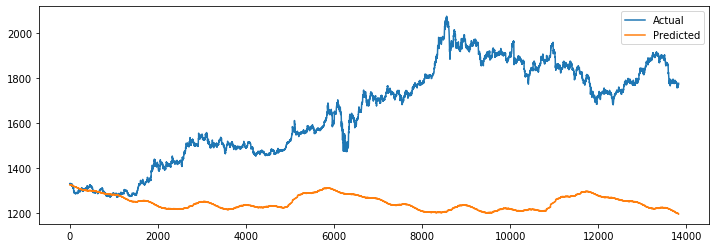

In [29]:
# plot expected vs actual
plt.figure(figsize=(12,4))
plt.plot(y_true, label='Actual')
plt.plot(y_pred, label='Predicted')
plt.legend()
plt.show()

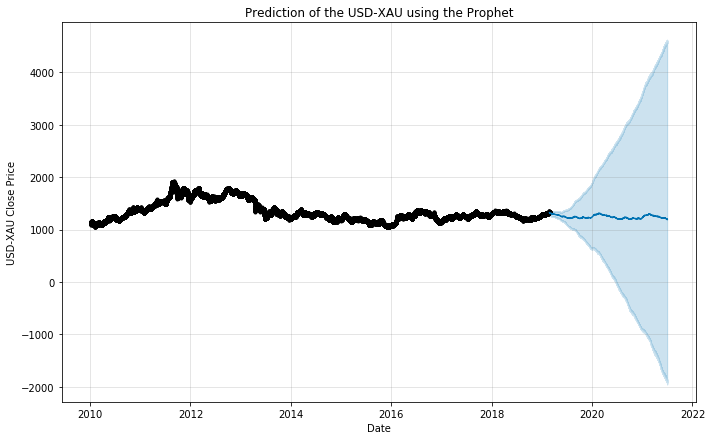

In [30]:
model.plot(forecast)
plt.title("Prediction of the USD-XAU using the Prophet")
plt.xlabel("Date")
plt.ylabel("USD-XAU Close Price")
plt.show()

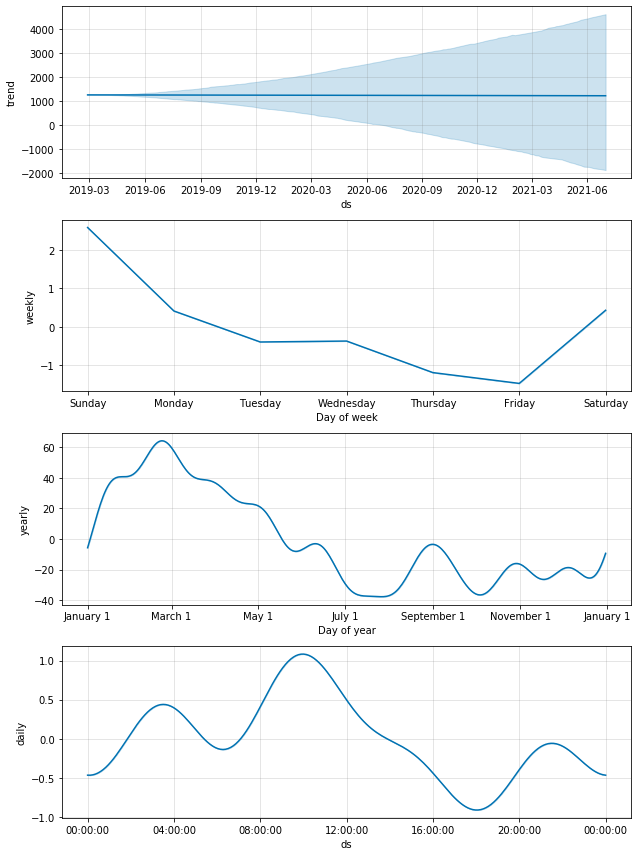

In [31]:
model.plot_components(forecast)
plt.show()

In [32]:
trace_open = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat"],
    mode = 'lines',
    name="Forecast"
)

trace_high = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat_upper"],
    mode = 'lines',
    fill = "tonexty", 
    line = {"color": "#57b8ff"}, 
    name="Higher uncertainty interval"
)

trace_low = go.Scatter(
    x = forecast["ds"],
    y = forecast["yhat_lower"],
    mode = 'lines',
    fill = "tonexty", 
    line = {"color": "#57b8ff"}, 
    name="Lower uncertainty interval"
)

trace_close = go.Scatter(
    x = data["ds"],
    y = data["y"],
    name="Data values"
)



data = [trace_open,trace_high,trace_low,trace_close]

layout = go.Layout(title="USD-XAU Forecast",xaxis_rangeslider_visible=True)

fig = go.Figure(data=data,layout=layout)

plotly.offline.iplot(fig)

In [33]:
test[test.index.min():].head()

,ds,y
Index,,
2019-02-25 21:00:00,2019-02-25 21:59:00,1329.608
2019-02-25 22:00:00,2019-02-25 22:59:00,1330.065
2019-02-25 23:00:00,2019-02-25 23:59:00,1329.455
2019-02-26 00:00:00,2019-02-26 00:59:00,1329.558
2019-02-26 01:00:00,2019-02-26 01:59:00,1328.945


In [34]:
forecast['yhat'].head()

0    1323.667986
1    1323.440037
2    1323.272341
3    1323.401710
4    1323.776794
Name: yhat, dtype: float64

In [35]:
forecast.columns

Index(['ds', 'trend', 'yhat_lower', 'yhat_upper', 'trend_lower', 'trend_upper',
       'additive_terms', 'additive_terms_lower', 'additive_terms_upper',
       'daily', 'daily_lower', 'daily_upper', 'weekly', 'weekly_lower',
       'weekly_upper', 'yearly', 'yearly_lower', 'yearly_upper',
       'multiplicative_terms', 'multiplicative_terms_lower',
       'multiplicative_terms_upper', 'yhat'],
      dtype='object')

In [36]:
forecast['ds'].head()

0   2019-02-25 21:59:00
1   2019-02-25 22:59:00
2   2019-02-25 23:59:00
3   2019-02-26 00:59:00
4   2019-02-26 01:59:00
Name: ds, dtype: datetime64[ns]

In [37]:
forecast['ds'] = pd.to_datetime(forecast['ds'])

In [38]:
forecast = forecast.set_index('ds')
forecast.head()

,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
ds,,,,,,,,,,,,,,,,,,,,,
2019-02-25 21:59:00,1261.085963,1278.557579,1366.990946,1261.085963,1261.085963,62.582023,62.582023,62.582023,-0.092131,-0.092131,...,-0.431821,-0.431821,-0.431821,63.105975,63.105975,63.105975,0.0,0.0,0.0,1323.667986
2019-02-25 22:59:00,1261.084223,1277.584635,1369.211069,1261.084223,1261.084223,62.355815,62.355815,62.355815,-0.308152,-0.308152,...,-0.414125,-0.414125,-0.414125,63.078092,63.078092,63.078092,0.0,0.0,0.0,1323.440037
2019-02-25 23:59:00,1261.082482,1278.330930,1369.520736,1261.082482,1261.082482,62.189859,62.189859,62.189859,-0.465290,-0.465290,...,-0.394722,-0.394722,-0.394722,63.049871,63.049871,63.049871,0.0,0.0,0.0,1323.272341
2019-02-26 00:59:00,1261.080742,1277.753150,1368.214283,1261.080742,1261.080742,62.320968,62.320968,62.320968,-0.326217,-0.326217,...,-0.374126,-0.374126,-0.374126,63.021311,63.021311,63.021311,0.0,0.0,0.0,1323.401710
2019-02-26 01:59:00,1261.079002,1278.631686,1372.711544,1261.079002,1261.079002,62.697792,62.697792,62.697792,0.058221,0.058221,...,-0.352844,-0.352844,-0.352844,62.992415,62.992415,62.992415,0.0,0.0,0.0,1323.776794


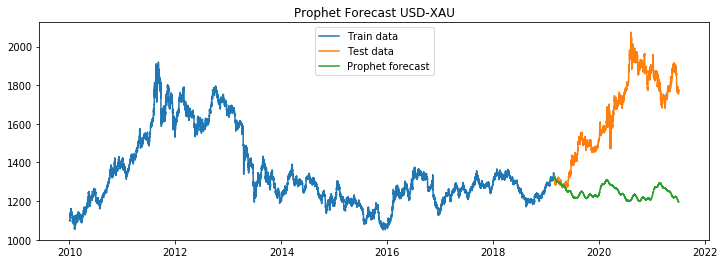

In [39]:
plt.figure(figsize=(12,4))
plt.plot(train['y'], label='Train data')
plt.plot(test['y'], label='Test data')
plt.plot(forecast['yhat'][test.index.min():], label='Prophet forecast')
plt.legend(loc='best')
plt.title('Prophet Forecast USD-XAU')
plt.show()